# README

-----------------

## Instructions:

1) run: git clone https://github.com/Hzzone/pytorch-openpose.git

2) Download body pose model at 
https://www.dropbox.com/sh/7xbup2qsn7vvjxo/AABWFksdlgOMXR_r5v3RwKRYa?dl=0 and place in model folder

3) run: pip install -r requirements.txt if you are missing some of the libraries (see below)

## Other info:

1) Openpose paper: https://arxiv.org/abs/1812.08008?utm_source=feedburner&utm_medium=feed&utm_campaign=Feed%253A+arxiv%252FQSXk+%2528ExcitingAds%2521+cs+updates+on+arXiv.org%2529

2) Original openpose repo: https://github.com/CMU-Perceptual-Computing-Lab/openpose

3) Keypoint ordering in openpose: https://github.com/CMU-Perceptual-Computing-Lab/openpose/blob/master/doc/output.md

## Alternatives:
Pytorch has pretrained model for person keypoint detection: Can consider using this too

mdl = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, progress=True, num_classes=91, pretrained_backbone=True, **kwargs)

----------------


## Import Libraries

In [54]:
# basic essential libraries
import matplotlib.pyplot as plt
import numpy as np
import os

# libraries for displaying images and videos
import cv2
import copy
from IPython.display import HTML
import io
import base64

# pose estimation library
from pytorch_openpose.src import model
from pytorch_openpose.src import util
from pytorch_openpose.src.body import Body

## Single image example

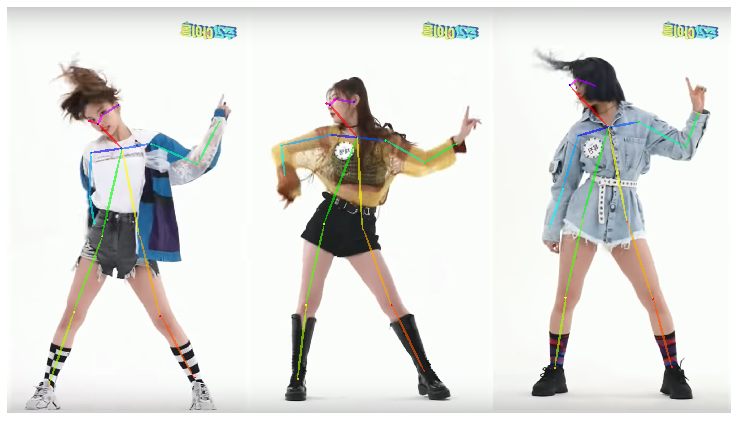

In [6]:
# Import model
body_estimation = Body('pytorch_openpose/model/body_pose_model.pth')

# Import image
test_image = 'images/vid1.png'
oriImg = cv2.imread(test_image)  # B,G,R order

# Body Estimation
candidate, subset = body_estimation(oriImg) # add %timeit at the start to time
# Execution Time: 8.89 s ± 215 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)

# Draw results on another image
canvas = copy.deepcopy(oriImg)
canvas = util.draw_bodypose(canvas, candidate, subset)

fig, axes = plt.subplots(1,1, figsize=(15,7.5))
plt.imshow(canvas[:, :, [2, 1, 0]])
plt.axis('off')
plt.show()

## Video example

In [197]:
# Helper functions

def disp_vid(source, width=480, height=240):
    '''
    Display video using iPython HTML embedding
    '''
    video_encoded = base64.b64encode(io.open(source, 'rb').read())
    return HTML("""<video width="{0}" height="{1}" alt="test" controls>
                <source src="data:video/mp4;base64,{2}" type="video/mp4">
                </video>
                """.format(width, height, video_encoded.decode('ascii')))

def pose_estimation(model,img):
    '''
    Run openpose pose estimation pipeline
    '''
    # Import image
    oriImg = cv2.imread(img)  # B,G,R order

    # Body Estimation
    candidate, subset = body_estimation(oriImg) # add %timeit at the start to time

    # Draw results on another image
    canvas = copy.deepcopy(oriImg)
    canvas = util.draw_bodypose(canvas, candidate, subset)
    return canvas, candidate, subset

def vid_2_frames(vid,img_dir,outstem='orig'):
    '''
    Covert input video into frames
    '''
    # create output directory
    try:
        if not os.path.exists(img_dir):
            os.makedirs(img_dir)
    except OSError:
        print ('Error: Creating could not create output directory')

    currentFrame = 0
    cap = cv2.VideoCapture(vid)
    while(cap.isOpened()):
        # Capture frame-by-frame
        ret, frame = cap.read()
        if not ret: break

        # Saves image of the current frame in jpg file
        name = img_dir + '/' + str(currentFrame) + '_' + outstem + '.jpg' # outstem is orig by default
        cv2.imwrite(name, frame)
        currentFrame += 1
        img_dim = (frame.shape[1], frame.shape[0], currentFrame) # save image dimensions

    # When everything is done, release the capture
    print(str(currentFrame) + ' frames created in ' + img_dir)
    cap.release()
    cv2.destroyAllWindows()
    return img_dim
    
def pose_estimation_video(model, img_dir, img_dim, outstem = 'orig'):
    '''
    Calculate pose estimation for every frame and recreate video with pose estimation, 
    and openpose outputs for every frame
    '''
    # check if img_dir exists
    assert os.path.exists(img_dir), print('Image directory does not exist, create using vid_2_frames first!')
    
    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'H264')
    out = cv2.VideoWriter(img_dir + '/output.mp4',fourcc, 20.0, (img_dim[0],img_dim[1])) # dimensions must be same as image
    
    currentFrame = 0
    candidate_all = []
    subset_all = []
    
    # perform pose estimation and write each output to video
    for n in range(img_dim[2]): # assume files have been split in format fname_orig
        f = str(n) + '_' + outstem +  '.jpg'
        print('processing frame ' + f)
        frame, candidate, subset = pose_estimation(model, img_dir + '/' + f)
        out.write(frame)
        candidate_all.append(candidate)
        subset_all.append(subset)
        currentFrame += 1
        
    np.savez(img_dir + '/pose_features', candidate_all=candidate_all, subset_all=subset_all)
    out.release()
    cv2.destroyAllWindows()
    return candidate_all, subset_all

In [198]:
# cut video into frames and display original video
img_dim = vid_2_frames('videos/video1/seg1.mp4', 'videos/video1/seg1_frames')
disp_vid('videos/video1/seg1.mp4',300,200)

152 frames created in videos/video1/seg1_frames


In [199]:
# perform pose estimation on each frame and output overlay
body_estimation = Body('pytorch_openpose/model/body_pose_model.pth')
candidate_all, subset_all = pose_estimation_video(body_estimation, 'videos/video1/seg1_frames',img_dim)
disp_vid('videos/video1/seg1_frames/output.mp4',300,200)

processing frame 0_orig.jpg
processing frame 1_orig.jpg
processing frame 2_orig.jpg
processing frame 3_orig.jpg
processing frame 4_orig.jpg
processing frame 5_orig.jpg
processing frame 6_orig.jpg
processing frame 7_orig.jpg
processing frame 8_orig.jpg
processing frame 9_orig.jpg
processing frame 10_orig.jpg
processing frame 11_orig.jpg
processing frame 12_orig.jpg
processing frame 13_orig.jpg
processing frame 14_orig.jpg
processing frame 15_orig.jpg
processing frame 16_orig.jpg
processing frame 17_orig.jpg
processing frame 18_orig.jpg
processing frame 19_orig.jpg
processing frame 20_orig.jpg
processing frame 21_orig.jpg
processing frame 22_orig.jpg
processing frame 23_orig.jpg
processing frame 24_orig.jpg
processing frame 25_orig.jpg
processing frame 26_orig.jpg
processing frame 27_orig.jpg
processing frame 28_orig.jpg
processing frame 29_orig.jpg
processing frame 30_orig.jpg
processing frame 31_orig.jpg
processing frame 32_orig.jpg
processing frame 33_orig.jpg
processing frame 34_orig

In [209]:
openpose_features = np.load('videos/video1/seg1_frames/pose_features.npz')
openpose_features['candidate_all']

ValueError: Object arrays cannot be loaded when allow_pickle=False